# Housing Prices in Perth

### Step 1: Importing required dependancies

In [98]:
# Dependencies and Setup
import os
import pandas as pd
import hvplot.pandas
from pathlib import Path
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as st
from scipy.stats import linregress
import numpy as np
import matplotlib.ticker as ticker

### Step 2: Reading data files

In [99]:
# File to Load 
all_perth_house = Path("resources/all_perth_310121.csv")

# Read all perth houses sales prices and store into Pandas DataFrames
house_prices_perth = pd.read_csv(all_perth_house)

### Step 3: Cleaning the data

In [100]:
# Specify the columns for display
columns_to_display = ["ADDRESS", "LATITUDE", "LONGITUDE", "SUBURB", "BEDROOMS",
                      "BATHROOMS", "GARAGE", "LAND AREA", "FLOOR AREA", "BUILD YEAR", "KM FROM CBD",
                      "CBD DIST", "DATE SOLD", "POSTCODE", "NEAREST SCH", "NEAREST SCH RANK",
                      "NEAREST SCH DIST"]

# Remove underscores from column names
house_prices_perth.columns = [col.replace("_", " ") for col in house_prices_perth.columns]

# Convert 'CBD DIST' from meters to kilometers
house_prices_perth['KM FROM CBD'] = house_prices_perth['CBD DIST'] / 1000

# Fill NaN values in 'GARAGE' column with 0
house_prices_perth['GARAGE'].fillna(0, inplace=True)


# Display the DataFrame with selected columns
selected_columns_df = house_prices_perth[columns_to_display]

house_prices_perth_cleaned = house_prices_perth.dropna(subset=['NEAREST SCH RANK', 'BUILD YEAR'])

In [101]:
# Copying the dataframe
house_prices_perth_cleaned= house_prices_perth_cleaned.copy()

# Cleaning the date sold column to remove \r
house_prices_perth_cleaned["DATE SOLD"] = house_prices_perth_cleaned["DATE SOLD"].str.replace("\r", "")

# Removing decimal from build year
house_prices_perth_cleaned["BUILD YEAR"] = house_prices_perth_cleaned["BUILD YEAR"].astype(int)

# Renaming certain columns
house_prices_perth_cleaned.rename(columns={"NEAREST SCH": "NEAREST SCHOOL", "NEAREST SCH DIST": "NEAREST SCHOOL DIST","NEAREST SCH RANK": "NEAREST SCHOOL RANK"}, inplace=True)

In [102]:
# Deleting data before 2010
house_prices_perth_cleaned[['SOLD MONTH', 'SOLD YEAR']] = house_prices_perth_cleaned['DATE SOLD'].str.split('-', expand=True)
house_prices_perth_cleaned['SOLD YEAR'] = house_prices_perth_cleaned['SOLD YEAR'].astype(int)
house_prices_perth_cleaned['GARAGE'] = house_prices_perth_cleaned['GARAGE'].astype(int)
house_prices_perth_cleaned = house_prices_perth_cleaned.loc[house_prices_perth_cleaned['SOLD YEAR'] >= 2010]

### Step 4: Analysis

In [103]:
# Grouping suburbs in bins
# Define bin edges
bin_edges = [0, 5, 10, 20, 30, float('inf')]  # Customize bin edges as needed

# Define bin labels
bin_labels = ['<5 km', '5-10 km', '10-20 km', '20-30 km', '>30 km']

# Use the cut function to create bins based on distance from the city
house_prices_perth_cleaned['DISTANCE BINS'] = pd.cut(house_prices_perth_cleaned['KM FROM CBD'], bins=bin_edges, labels=bin_labels, right=False)

# Sort and display the DataFrame with the new 'Distance Bin' column
house_prices_perth_cleaned = house_prices_perth_cleaned.sort_values(by=['DISTANCE BINS','PRICE','BEDROOMS','BATHROOMS','GARAGE'], ascending=True)
house_prices_perth_cleaned.head()

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND AREA,FLOOR AREA,BUILD YEAR,CBD DIST,...,POSTCODE,LATITUDE,LONGITUDE,NEAREST SCHOOL,NEAREST SCHOOL DIST,NEAREST SCHOOL RANK,KM FROM CBD,SOLD MONTH,SOLD YEAR,DISTANCE BINS
14224,25 Robin Street,Menora,128000,4,1,1,1012,166,1950,3300,...,6050,-31.92286,115.86556,MOUNT LAWLEY SENIOR HIGH SCHOOL,0.435426,20.0,3.300,04,2016,<5 km
14520,26 George Street,Belmont,176649,3,1,2,767,761,1954,3347,...,6104,-31.94709,115.93807,BELMONT CITY COLLEGE,1.356765,57.0,3.347,03,2017,<5 km
28305,66 Green Street,Joondanna,200000,2,1,0,280,90,1949,4700,...,6060,-31.91388,115.83875,SERVITE COLLEGE,1.333358,65.0,4.700,06,2016,<5 km
17404,30 Dumbarton Crescent,Menora,202500,4,2,2,895,174,1947,3600,...,6050,-31.91978,115.85761,MOUNT LAWLEY SENIOR HIGH SCHOOL,1.157250,20.0,3.600,11,2013,<5 km
4035,12/10 East Street,Maylands,215000,2,1,0,84,70,1975,3700,...,6051,-31.93576,115.89322,PERTH COLLEGE,1.750337,9.0,3.700,10,2019,<5 km


### Step 4: Analysis: Studying the change in average price in Perth over a decade from 2010 to 2020

In [104]:
# Convert the 'DATE SOLD' column to a datetime object
house_prices_perth_cleaned['DATE SOLD'] = pd.to_datetime(house_prices_perth_cleaned['DATE SOLD'])

# Extract the year from the 'DATE SOLD' column
house_prices_perth_cleaned['YEAR SOLD'] = house_prices_perth_cleaned['DATE SOLD'].dt.year

# Group by year and calculate the mean price for each year
average_prices_by_year = house_prices_perth_cleaned.groupby('YEAR SOLD')['PRICE'].mean().round(2)

# Create a new DataFrame from the calculated averages
average_prices_df = pd.DataFrame({
    'YEAR SOLD': average_prices_by_year.index, 
    'AVERAGE PRICE': average_prices_by_year.values
})

# Group by year and calculate the count of houses sold per year
houses_per_year = house_prices_perth_cleaned.groupby('YEAR SOLD')['PRICE'].count().reset_index()

# Rename the 'PRICE' column to 'HOUSE COUNT'
houses_per_year.rename(columns={'PRICE': 'HOUSE COUNT'}, inplace=True)

# Printing the dataframe
merged_df = pd.merge(average_prices_df, houses_per_year, on='YEAR SOLD', how='left')
merged_df

,YEAR SOLD,AVERAGE PRICE,HOUSE COUNT
0,2010,785061.07,149
1,2011,693683.25,208
2,2012,670052.98,311
3,2013,696101.11,619
4,2014,714418.86,967
5,2015,713083.71,1724
6,2016,718879.67,2399
7,2017,732743.51,3220
8,2018,716685.25,3620
9,2019,673736.22,3389


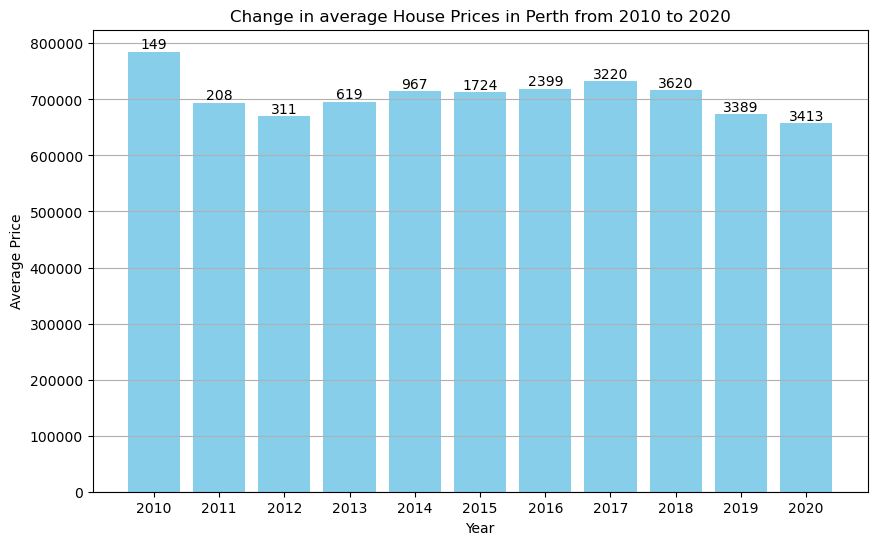

In [105]:
# Data for the bar graph
years = merged_df['YEAR SOLD']
average_prices = merged_df['AVERAGE PRICE']
house_counts = merged_df['HOUSE COUNT']

# Create a bar graph 
plt.figure(figsize=(10, 6))
bars = plt.bar(years, average_prices, color='skyblue')

# Customize the plot
plt.title('Change in average House Prices in Perth from 2010 to 2020')
plt.xlabel('Year')
plt.ylabel('Average Price')
plt.xticks(years)
plt.grid(axis='y')

# Add values from 'HOUSE COUNT' as text labels on each bar
for bar, count in zip(bars, house_counts):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 100, f"{count}", ha='center', va='bottom', fontsize=10)

# Show the plot
plt.show()

### Step 4: Analysis: Calculating the change in average price in different suburbs in Perth over 10years from 2010 to 2020

In [106]:
# Finding number of houses in each suburbs from 2010  to 2020
houses_sold_per_suburb = house_prices_perth_cleaned.groupby('SUBURB')['ADDRESS'].count().reset_index(name='TOTAL HOUSES SOLD')

# Group by suburb and year, calculate the mean price for each combination
suburb_yearly_mean_price = house_prices_perth_cleaned.groupby(['SUBURB', 'YEAR SOLD', 'DISTANCE BINS'])['PRICE'].mean().round(2).reset_index()

# Create a pivot table to put the data into a DataFrame
pivot_table = pd.pivot_table(suburb_yearly_mean_price, values='PRICE', index='SUBURB', columns='YEAR SOLD', aggfunc='mean').reset_index()

# Renaming columns 
pivot_table.columns.name = None
pivot_table.fillna(0, inplace=True)

# Merging two DataFrames based on the 'SUBURB' column
merged_df = pd.merge(houses_sold_per_suburb, pivot_table, on='SUBURB', how='inner')

# Printing df
merged_df

,SUBURB,TOTAL HOUSES SOLD,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Alexander Heights,40,0.00,0.00,0.00,0.00,0.000,0.000,506333.330,4.255000e+05,462125.000,367312.500,458555.560
1,Alfred Cove,100,0.00,0.00,0.00,0.00,891166.665,973921.875,866166.665,8.008393e+05,743441.665,769214.285,728333.335
2,Alkimos,79,0.00,0.00,0.00,0.00,0.000,0.000,0.000,0.000000e+00,413104.170,407687.500,392913.040
3,Applecross,73,0.00,0.00,0.00,0.00,0.000,0.000,0.000,1.350167e+06,1627363.640,1290809.520,1183888.890
4,Ardross,107,0.00,0.00,0.00,0.00,0.000,0.000,994477.800,1.091939e+06,1096312.500,1039638.890,1169642.860
...,...,...,...,...,...,...,...,...,...,...,...,...,...
272,Woodbridge,57,696666.67,432555.56,645333.33,566700.00,577500.000,515000.000,617500.000,7.837500e+05,495200.000,817500.000,655000.000
273,Woodlands,75,0.00,0.00,0.00,0.00,1537500.000,986916.670,1253863.640,1.214667e+06,1267127.710,1172571.430,1030540.000
274,Woodvale,86,0.00,0.00,0.00,0.00,0.000,0.000,0.000,6.026026e+05,645166.150,642888.885,677400.000
275,Wooroloo,22,0.00,450500.00,0.00,453666.67,550000.000,549750.000,310000.000,4.516667e+05,995000.000,0.000,0.000


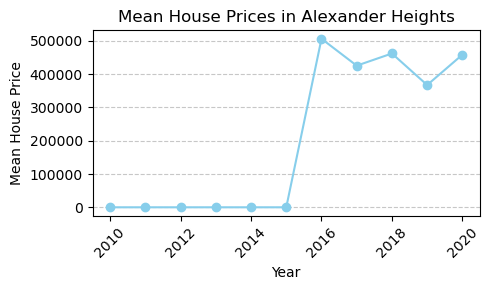

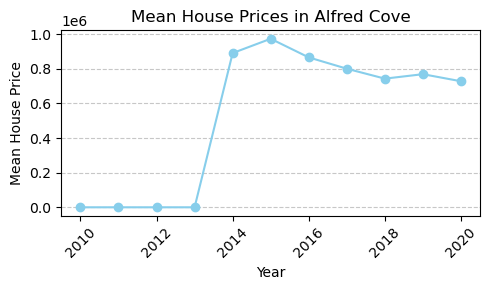

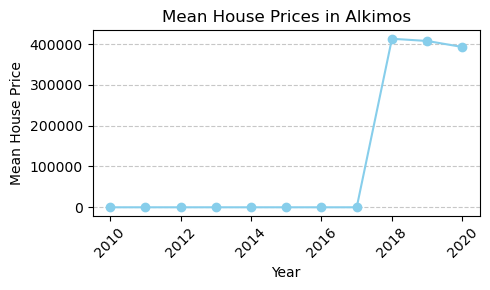

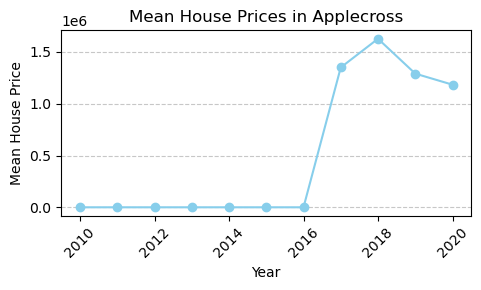

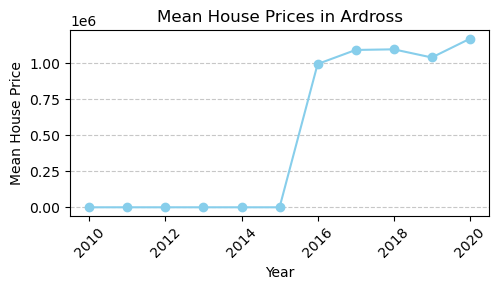

...

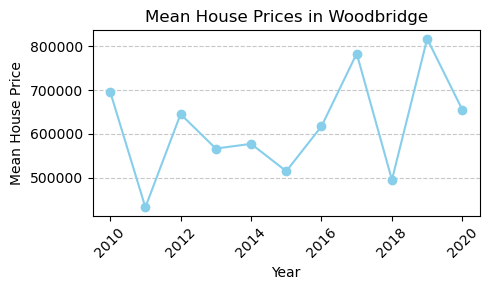

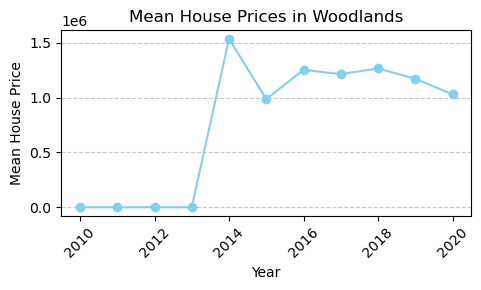

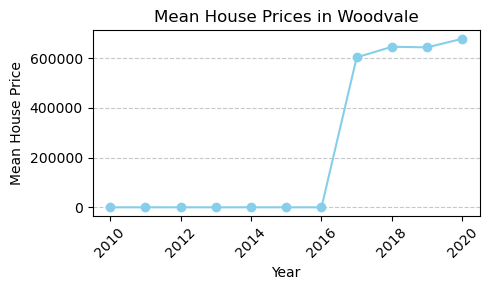

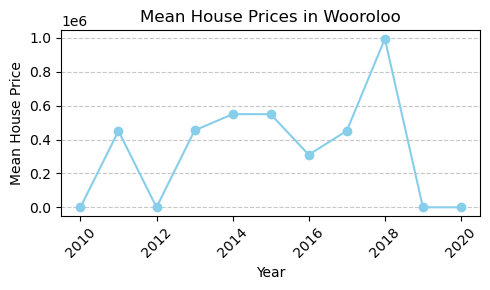

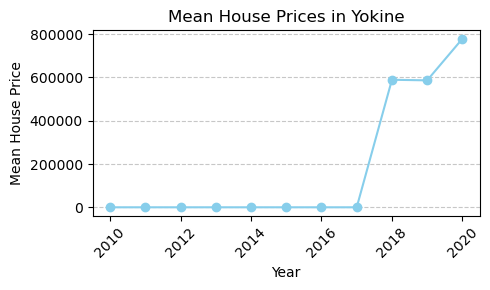

In [107]:
# Iterate through each suburb and create a line chart
for suburb in pivot_table['SUBURB']:
    # Extract data for the current suburb
    suburb_data = pivot_table[pivot_table['SUBURB'] == suburb]
    
    # Get years and mean prices for the current suburb
    years = suburb_data.columns[1:]
    mean_prices = suburb_data.iloc[0, 1:]
    
    # Create a line chart for the suburb's mean prices over the years
    plt.figure(figsize=(5, 3))
    plt.plot(years, mean_prices, marker='o', color='skyblue', linestyle='-')
    plt.xlabel('Year')
    plt.ylabel('Mean House Price')
    plt.title(f'Mean House Prices in {suburb}')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    # Save the figures
    output_directory = "Output"
    subdirectory = "mean_houseprices_suburbs"
    filename = os.path.join(output_directory, subdirectory, f'{suburb}.png')
    plt.savefig(filename, bbox_inches='tight')
    
    plt.show()

### Step 4: Analysis: Studying the change in average price in different suburbs in Perth over 10years from 2010 to 2020 based on proximity to the CBD

In [108]:
suburb_yearly_mean_price = house_prices_perth_cleaned.groupby(['YEAR SOLD', 'DISTANCE BINS'])['PRICE'].mean().round(2).reset_index()

# Create a new DataFrame with suburbs grouped by distance bins
suburbs_by_distance = house_prices_perth_cleaned.groupby(pd.cut(house_prices_perth_cleaned['KM FROM CBD'], bins=bin_edges, labels=bin_labels, right=False))['SUBURB'].agg(', '.join).reset_index()

# Rename the columns for better clarity
suburbs_by_distance.columns = ['DISTANCE BINS', 'SUBURBS']

# Merge suburb data from suburbs_by_distance into suburb_yearly_mean_price
merged_df = suburb_yearly_mean_price.merge(suburbs_by_distance, on='DISTANCE BINS', how='left')

# Display the resulting DataFrame
merged_df.head()

,YEAR SOLD,DISTANCE BINS,PRICE,SUBURBS
0,2010,<5 km,1168366.67,"Menora, Belmont, Joondanna, Menora, Maylands, ..."
1,2010,5-10 km,758500.00,"Joondanna, Tuart Hill, Wembley Downs, Joondann..."
2,2010,10-20 km,678583.33,"Middle Swan, Craigie, Martin, Mirrabooka, Lang..."
3,2010,20-30 km,725000.00,"Kallaroo, Heathridge, Armadale, Currambine, Be..."
4,2010,>30 km,489268.18,"Hillman, Golden Bay, Merriwa, Gidgegannup, Med..."


In [97]:
# Function to format y-axis labels in expanded form
def price_formatter(x, pos):
    return "${:,.0f}".format(x)

bar_width = 0.1
index = range(len(distance_bins))

# Loop through each year and create a separate line plot
for year in years:
    # Filter data for the current year
    year_data = merged_df[merged_df['YEAR SOLD'] == year]
    
    # Get average prices for the current year
    average_prices = year_data['PRICE']
    
    # Create a new figure for each year
    plt.figure(figsize=(5, 3)) 
    
    # Create a line plot for the current year
    plt.plot(index, average_prices, marker='o', label=str(year))  # Adjust marker style as needed
    plt.xlabel('Distance to CBD')
    plt.ylabel('Average Price')
    plt.title(f'Average House Prices in {year}')
    
    # Format the y-axis labels using the custom price_formatter function
    plt.gca().get_yaxis().set_major_formatter(ticker.FuncFormatter(price_formatter))
    
    plt.xticks(index, year_data['DISTANCE BINS'], rotation=90)
    
    # Save the figure
    output_directory = "Output"
    subdirectory = "mean_houseprices_perth_years"
    filename = os.path.join(output_directory, subdirectory, f'{year}.png')
    plt.savefig(filename, bbox_inches='tight')
        
    # Show the plot 
    plt.tight_layout()
    plt.legend()  
    plt.grid(True)  
    plt.show()

NameError: name 'distance_bins' is not defined

### Step 4: Analysis: Calculating relationship between property characteristics and house prices in Perth

##### Property characteristics include: Land Area, Floor Area, No:of Bedrooms, No:of Bathrooms, No:of Garages.

In [86]:
# Define a function to create Linear Regression plots
def linear_regression(x,y,):
    print(f"The r-value is: {round(st.pearsonr(x, y)[0],3)}")
    (slope, intercept, rvalue, pvalue, stderr) = linregress(x, y)
    regress_values = x * slope + intercept
    line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
    print(f"The line equation is: {line_eq}")
    plt.scatter(x, y)
    plt.plot(x,regress_values,"r-")
    return line_eq

def annotate(line_eq, a, b):
    plt.annotate(line_eq,(a,b),fontsize=15,color="red")

The r-value is: 0.037
The line equation is: y = 0.77x + 699012.74


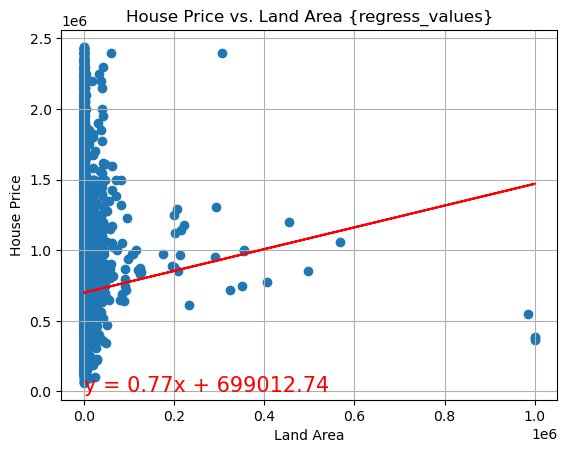

In [109]:
# Linear regression on Northern Hemisphere
linear_reg = linear_regression(house_prices_perth_cleaned['LAND AREA'],house_prices_perth_cleaned['PRICE'])
annotate(linear_reg,0,40)

# Incorporate the other graph properties
plt.title(f"House Price vs. Land Area {regress_values}')
plt.xlabel('Land Area')
plt.ylabel('House Price')
plt.grid(True)

# Save the figures
output_directory = "Output"
subdirectory = "regression_plots"
filename = os.path.join(output_directory, subdirectory, f'House Price vs. Land Area.png')
plt.savefig(filename, bbox_inches='tight')

The r-value is: 0.575
The line equation is: y = 3078.35x + 127118.49


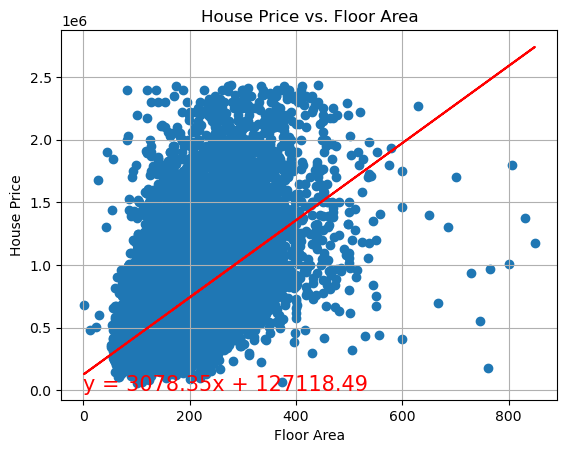

In [89]:
# Linear regression on Northern Hemisphere
linear_reg = linear_regression(house_prices_perth_cleaned['FLOOR AREA'],house_prices_perth_cleaned['PRICE'])
annotate(linear_reg,0,40)

# Incorporate the other graph properties
plt.title('House Price vs. Floor Area')
plt.xlabel('Floor Area')
plt.ylabel('House Price')
plt.grid(True)

# Save the figures
output_directory = "Output"
subdirectory = "regression_plots"
filename = os.path.join(output_directory, subdirectory, f'House Price vs. Floor Area.png')
plt.savefig(filename, bbox_inches='tight')

The r-value is: 0.258
The line equation is: y = 132362.95x + 216327.65


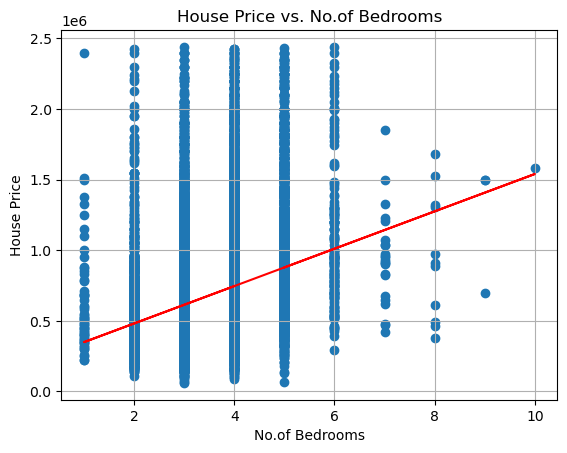

In [90]:
# Linear regression on Northern Hemisphere
linear_reg = linear_regression(house_prices_perth_cleaned['BEDROOMS'],house_prices_perth_cleaned['PRICE'])
annotate(linear_reg,0,40)

# Incorporate the other graph properties
plt.title('House Price vs. No.of Bedrooms')
plt.xlabel('No.of Bedrooms')
plt.ylabel('House Price')
plt.grid(True)

# Save the figures
output_directory = "Output"
subdirectory = "regression_plots"
filename = os.path.join(output_directory, subdirectory, f'House Price vs. No.of Bedrooms.png')
plt.savefig(filename, bbox_inches='tight')

The r-value is: 0.393
The line equation is: y = 257134.28x + 226288.1


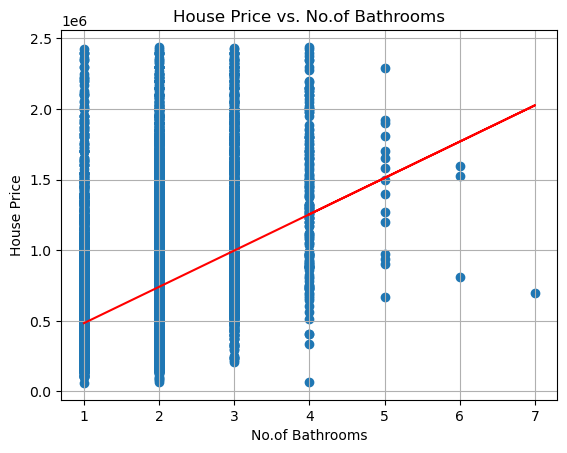

In [91]:
# Linear regression on Northern Hemisphere
linear_reg = linear_regression(house_prices_perth_cleaned['BATHROOMS'],house_prices_perth_cleaned['PRICE'])
annotate(linear_reg,0,40)

# Incorporate the other graph properties
plt.title('House Price vs. No.of Bathrooms')
plt.xlabel('No.of Bathrooms')
plt.ylabel('House Price')
plt.grid(True)

# Save the figures
output_directory = "Output"
subdirectory = "regression_plots"
filename = os.path.join(output_directory, subdirectory, f'House Price vs. No.of Bathrooms.png')
plt.savefig(filename, bbox_inches='tight')

The r-value is: 0.128
The line equation is: y = 38052.52x + 623091.09


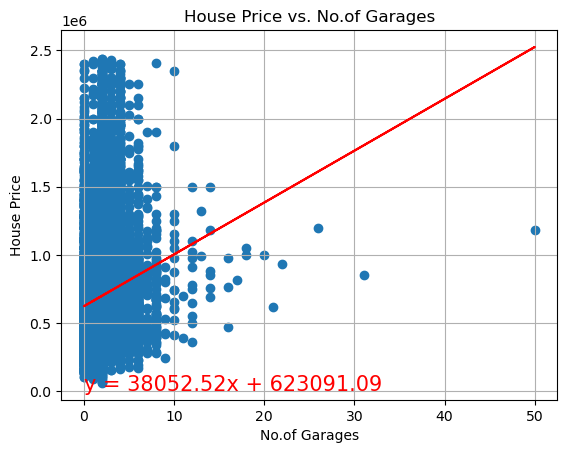

In [92]:
# Linear regression on Northern Hemisphere
linear_reg = linear_regression(house_prices_perth_cleaned['GARAGE'],house_prices_perth_cleaned['PRICE'])
annotate(linear_reg,0,40)

# Incorporate the other graph properties
plt.title('House Price vs. No.of Garages')
plt.xlabel('No.of Garages')
plt.ylabel('House Price')
plt.grid(True)

# Save the figures
output_directory = "Output"
subdirectory = "regression_plots"
filename = os.path.join(output_directory, subdirectory, f'House Price vs. No.of Garages.png')
plt.savefig(filename, bbox_inches='tight')

### Step 4: Analysis: Calculating relationship between location characteristics and house prices in Perth

##### Location characteristics include: Distance from CBD, Distance to nearest School, Distance to nearest Station

The r-value is: -0.395
The line equation is: y = -13944.43x + 956039.45


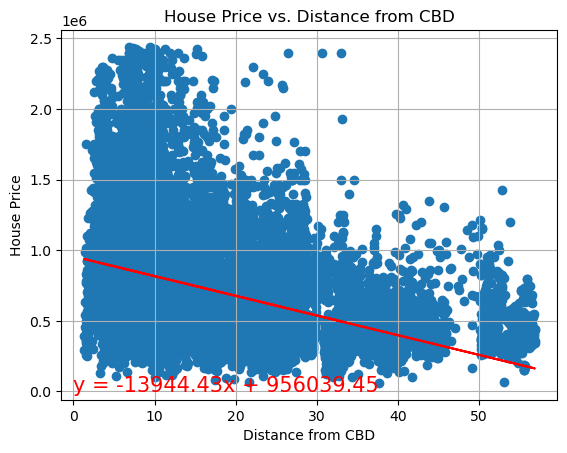

In [93]:
# Linear regression on Northern Hemisphere
linear_reg = linear_regression(house_prices_perth_cleaned['KM FROM CBD'],house_prices_perth_cleaned['PRICE'])
annotate(linear_reg,0,40)

# Incorporate the other graph properties
plt.title('House Price vs. Distance from CBD')
plt.xlabel('Distance from CBD')
plt.ylabel('House Price')
plt.grid(True)

# Save the figures
output_directory = "Output"
subdirectory = "regression_plots"
filename = os.path.join(output_directory, subdirectory, f'House Price vs. Distance from CBD.png')
plt.savefig(filename, bbox_inches='tight')

The r-value is: -0.032
The line equation is: y = -7963.54x + 713853.24


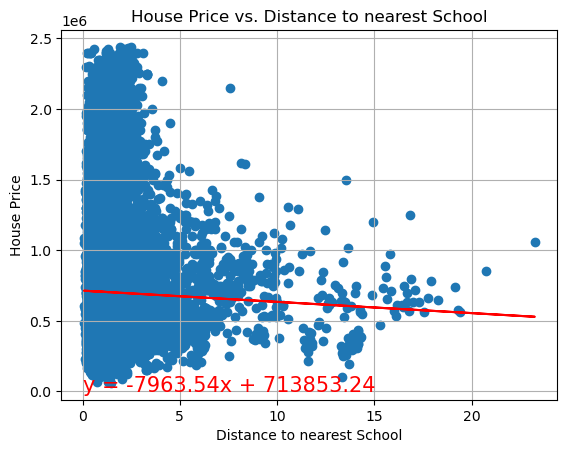

In [94]:
# Linear regression on Northern Hemisphere
linear_reg = linear_regression(house_prices_perth_cleaned['NEAREST SCHOOL DIST'],house_prices_perth_cleaned['PRICE'])
annotate(linear_reg,0,40)

# Incorporate the other graph properties
plt.title('House Price vs. Distance to nearest School')
plt.xlabel('Distance to nearest School')
plt.ylabel('House Price')
plt.grid(True)

# Save the figures
output_directory = "Output"
subdirectory = "regression_plots"
filename = os.path.join(output_directory, subdirectory, f'House Price vs. Distance to nearest School.png')
plt.savefig(filename, bbox_inches='tight')

The r-value is: -0.13
The line equation is: y = -12.05x + 750526.74


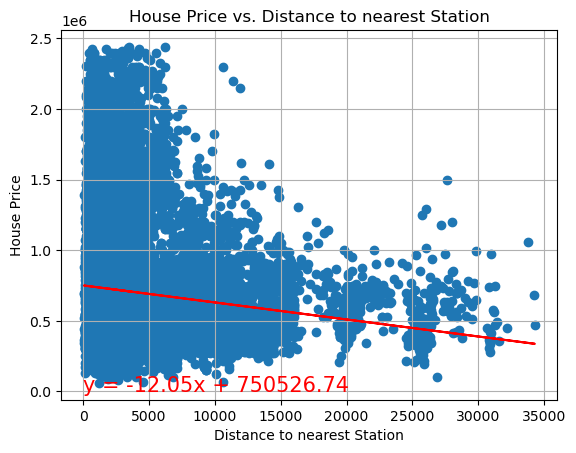

In [95]:
# Linear regression on Northern Hemisphere
linear_reg = linear_regression(house_prices_perth_cleaned['NEAREST STN DIST'],house_prices_perth_cleaned['PRICE'])
annotate(linear_reg,0,40)

# Incorporate the other graph properties
plt.title('House Price vs. Distance to nearest Station')
plt.xlabel('Distance to nearest Station')
plt.ylabel('House Price')
plt.grid(True)

# Save the figures
output_directory = "Output"
subdirectory = "regression_plots"
filename = os.path.join(output_directory, subdirectory, f'House Price vs. Distance to nearest Station.png')
plt.savefig(filename, bbox_inches='tight')

### Step 4: Analysis: Calculating avg price, property characteristics and location characteristics of different suburbs in Perth

In [28]:
# Calculate the mean, median and mode for the price, no: of bedrooms, bathrooms garages etc.in each suburb in Perth.
price_mean =  house_prices_perth_cleaned.groupby('SUBURB')['PRICE'].mean().round()
bedroom_mean =  house_prices_perth_cleaned.groupby('SUBURB')['BEDROOMS'].mean().round()
bath_mean =  house_prices_perth_cleaned.groupby('SUBURB')['BATHROOMS'].mean().round()
garage_mean =  house_prices_perth_cleaned.groupby('SUBURB')['GARAGE'].mean().round()

landarea_mean =  house_prices_perth_cleaned.groupby('SUBURB')['LAND AREA'].mean().round()
floorarea_mean =  house_prices_perth_cleaned.groupby('SUBURB')['FLOOR AREA'].mean().round()
near_stn_mean =  house_prices_perth_cleaned.groupby('SUBURB')['NEAREST STN DIST'].mean().round()
near_sch_mean =  house_prices_perth_cleaned.groupby('SUBURB')['NEAREST SCHOOL DIST'].mean().round()
cbd_mean =  house_prices_perth_cleaned.groupby('SUBURB')['KM FROM CBD'].mean().round()


price_median = house_prices_perth_cleaned.groupby('SUBURB')['PRICE'].median().round(2)
bedroom_median = house_prices_perth_cleaned.groupby('SUBURB')['BEDROOMS'].median().round(2)
bath_median = house_prices_perth_cleaned.groupby('SUBURB')['BATHROOMS'].median().round(2)
garage_median = house_prices_perth_cleaned.groupby('SUBURB')['GARAGE'].median().round(2)
landarea_median =  house_prices_perth_cleaned.groupby('SUBURB')['LAND AREA'].median().round(2)


price_var = house_prices_perth_cleaned.groupby('SUBURB')['PRICE'].var().round(2)      
bedroom_var = house_prices_perth_cleaned.groupby('SUBURB')['BEDROOMS'].var().round(2)      
bath_var = house_prices_perth_cleaned.groupby('SUBURB')['PRICE'].var().round(2)      
garage_var = house_prices_perth_cleaned.groupby('SUBURB')['GARAGE'].var().round(2)      
landarea_var = house_prices_perth_cleaned.groupby('SUBURB')['LAND AREA'].var().round(2)      

price_std = house_prices_perth_cleaned.groupby('SUBURB')['PRICE'].std().round(2)
bedroom_std = house_prices_perth_cleaned.groupby('SUBURB')['BEDROOMS'].std().round(2)
bath_std = house_prices_perth_cleaned.groupby('SUBURB')['BATHROOMS'].std().round(2)
garage_std = house_prices_perth_cleaned.groupby('SUBURB')['GARAGE'].std().round(2)
landarea_std = house_prices_perth_cleaned.groupby('SUBURB')['LAND AREA'].std().round(2)

price_sem = house_prices_perth_cleaned.groupby('SUBURB')['PRICE'].sem().round(2)
bedroom_sem = house_prices_perth_cleaned.groupby('SUBURB')['BEDROOMS'].sem().round(2)
bath_sem = house_prices_perth_cleaned.groupby('SUBURB')['BATHROOMS'].sem().round(2)
garage_sem = house_prices_perth_cleaned.groupby('SUBURB')['GARAGE'].sem().round(2)
landarea_sem = house_prices_perth_cleaned.groupby('SUBURB')['LAND AREA'].sem().round(2)


#Printig DataFrame.
suburb_summary_stat_df =pd.DataFrame ({
    "Mean House Prices":price_mean,
    "Average Land Area":landarea_mean,
    "Average Floor Area":floorarea_mean,
    
    "Mean No.of Bedrooms":bedroom_mean,
    "Mean No.of Bathrooms":bath_mean,
    "Mean No.of Garages":garage_mean,

    "Average Distatnce to Stn":near_stn_mean,
    "Average Distatnce to School":near_sch_mean,
    "Average Distatnce from CBD":cbd_mean,
    
    
    "Median House Prices":price_median,
    "Median Land Area":landarea_median,
    "Median No.of Bedrooms":bedroom_median,
    "Median No.of Bathrooms":bath_median,
    "Median No.of Garages":garage_median
    
})                                                                                                          

suburb_summary_stat_df

,Mean House Prices,Average Land Area,Average Floor Area,Mean No.of Bedrooms,Mean No.of Bathrooms,Mean No.of Garages,Average Distatnce to Stn,Average Distatnce to School,Average Distatnce from CBD,Median House Prices,Median Land Area,Median No.of Bedrooms,Median No.of Bathrooms,Median No.of Garages
SUBURB,,,,,,,,,,,,,,
Alexander Heights,443150.0,646.0,162.0,4.0,2.0,2.0,6920.0,2.0,14.0,440000.0,691.5,4.0,2.0,2.0
Alfred Cove,849335.0,578.0,186.0,4.0,2.0,2.0,3867.0,1.0,10.0,805000.0,507.0,3.0,2.0,2.0
Alkimos,405032.0,12850.0,173.0,4.0,2.0,2.0,2150.0,4.0,40.0,390000.0,388.0,4.0,2.0,2.0
Applecross,1396130.0,704.0,227.0,4.0,2.0,2.0,1773.0,2.0,7.0,1365000.0,550.0,4.0,2.0,2.0
Ardross,1066473.0,547.0,212.0,4.0,2.0,2.0,2415.0,1.0,9.0,1032500.0,493.0,4.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodbridge,577447.0,839.0,156.0,3.0,2.0,2.0,314.0,1.0,14.0,560000.0,607.0,3.0,2.0,2.0
Woodlands,1167953.0,671.0,234.0,4.0,2.0,2.0,2203.0,1.0,8.0,1190000.0,728.0,4.0,2.0,2.0
Woodvale,648878.0,687.0,205.0,4.0,2.0,2.0,1328.0,1.0,19.0,645000.0,717.0,4.0,2.0,2.0


In [14]:
total_rows = len(house_prices_perth_cleaned)
print(total_rows)

20019


In [66]:
# Calculate the 80th percentile of house prices
percentile_80 = house_prices_perth_cleaned['PRICE'].quantile(0.80)
percentile_95 = house_prices_perth_cleaned['PRICE'].quantile(0.95)
percentile_20 = house_prices_perth_cleaned['PRICE'].quantile(0.20)
percentile_05 = house_prices_perth_cleaned['PRICE'].quantile(0.05)

# Filter the DataFrame to include only rows with house prices in the top 20%
top_20_percent_df = house_prices_perth_cleaned[house_prices_perth_cleaned['PRICE'] >= percentile_80]
bottom_20_percent_df = house_prices_perth_cleaned[house_prices_perth_cleaned['PRICE'] <= percentile_20]

top_5_percent_df = house_prices_perth_cleaned[house_prices_perth_cleaned['PRICE'] >= percentile_95]
bottom_5_percent_df = house_prices_perth_cleaned[house_prices_perth_cleaned['PRICE'] <= percentile_05]

# Define the list of specific columns you want to keep
columns_to_keep = ["SUBURB", "PRICE", 'BEDROOMS', 'BATHROOMS', 'GARAGE', 'LAND AREA','FLOOR AREA',"LONGITUDE", "LATITUDE","KM FROM CBD", "NEAREST SCHOOL DIST", "NEAREST STN DIST", "DISTANCE BINS"]

# Create a new DataFrame with only the specified columns
top_20_percent_df = top_20_percent_df[columns_to_keep]
bottom_20_percent_df = bottom_20_percent_df[columns_to_keep]
top_5_percent_df = top_5_percent_df[columns_to_keep]
bottom_5_percent_df = bottom_5_percent_df[columns_to_keep]

# Display the new DataFrame with specific columns
top_20_percent_df

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND AREA,FLOOR AREA,LONGITUDE,LATITUDE,KM FROM CBD,NEAREST SCHOOL DIST,NEAREST STN DIST,DISTANCE BINS
19340,Highgate,925000,2,1,2,621,200,115.869930,-31.939920,1.7,1.104509,855,<5 km
2314,West Perth,925000,3,1,1,369,158,115.850310,-31.938710,1.7,1.459809,954,<5 km
7170,North Perth,925000,3,1,2,491,116,115.854840,-31.923170,3.3,1.184020,2200,<5 km
20524,Kensington,925000,3,2,2,767,128,115.886180,-31.982350,4.2,0.716207,2400,<5 km
32203,West Leederville,925000,3,2,2,533,155,115.826780,-31.939690,3.3,1.086890,603,<5 km
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29157,Mindarie,1500000,4,3,4,1326,295,115.703280,-31.686960,33.0,1.140695,3300,>30 km
6915,Bullsbrook,1500000,9,4,1,81448,371,115.955327,-31.652252,34.6,13.555111,27600,>30 km
10445,Mindarie,1930000,4,2,2,700,349,115.702200,-31.686780,33.1,1.149426,3400,>30 km
30360,Darling Downs,2400000,3,1,0,306500,82,116.010238,-32.196354,30.7,3.112885,4700,>30 km


In [67]:
bottom_20_percent_df

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND AREA,FLOOR AREA,LONGITUDE,LATITUDE,KM FROM CBD,NEAREST SCHOOL DIST,NEAREST STN DIST,DISTANCE BINS
14224,Menora,128000,4,1,1,1012,166,115.865560,-31.922860,3.300,0.435426,2000,<5 km
14520,Belmont,176649,3,1,2,767,761,115.938070,-31.947090,3.347,1.356765,3345,<5 km
28305,Joondanna,200000,2,1,0,280,90,115.838750,-31.913880,4.700,1.333358,1500,<5 km
17404,Menora,202500,4,2,2,895,174,115.857610,-31.919780,3.600,1.157250,3500,<5 km
4035,Maylands,215000,2,1,0,84,70,115.893220,-31.935760,3.700,1.750337,851,<5 km
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6376,Safety Bay,410000,4,2,3,682,191,115.728150,-32.302200,40.900,1.210766,3400,>30 km
4477,Byford,410000,4,2,4,520,212,116.007476,-32.237276,34.800,1.627443,9300,>30 km
33523,Shoalwater,410000,4,2,4,580,287,115.723822,-32.297497,40.500,1.735539,3600,>30 km
31199,Warnbro,410000,4,2,6,670,153,115.757650,-32.331180,43.300,1.357755,1100,>30 km


In [68]:
top_5_percent_df

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND AREA,FLOOR AREA,LONGITUDE,LATITUDE,KM FROM CBD,NEAREST SCHOOL DIST,NEAREST STN DIST,DISTANCE BINS
33428,West Leederville,1510000,3,1,0,416,295,115.834910,-31.937320,2.8,0.872928,534,<5 km
4510,Menora,1520000,4,2,2,726,206,115.858560,-31.921310,3.4,1.056418,3300,<5 km
15255,Shenton Park,1530000,4,2,2,524,196,115.810050,-31.956510,4.6,0.753393,520,<5 km
26210,Coolbinia,1530000,4,3,4,813,355,115.853420,-31.916214,4.0,1.547362,2900,<5 km
19063,Leederville,1543500,2,1,3,611,294,115.840881,-31.926861,3.3,0.217314,1300,<5 km
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11976,Henley Brook,2300000,3,1,1,42375,410,116.003562,-31.796669,22.1,1.731529,10600,20-30 km
15274,Mariginiup,2400000,1,1,1,60341,120,115.808190,-31.719470,26.4,2.560309,5500,20-30 km
10445,Mindarie,1930000,4,2,2,700,349,115.702200,-31.686780,33.1,1.149426,3400,>30 km
30360,Darling Downs,2400000,3,1,0,306500,82,116.010238,-32.196354,30.7,3.112885,4700,>30 km


In [69]:
bottom_5_percent_df

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND AREA,FLOOR AREA,LONGITUDE,LATITUDE,KM FROM CBD,NEAREST SCHOOL DIST,NEAREST STN DIST,DISTANCE BINS
14224,Menora,128000,4,1,1,1012,166,115.865560,-31.92286,3.300,0.435426,2000,<5 km
14520,Belmont,176649,3,1,2,767,761,115.938070,-31.94709,3.347,1.356765,3345,<5 km
28305,Joondanna,200000,2,1,0,280,90,115.838750,-31.91388,4.700,1.333358,1500,<5 km
17404,Menora,202500,4,2,2,895,174,115.857610,-31.91978,3.600,1.157250,3500,<5 km
4035,Maylands,215000,2,1,0,84,70,115.893220,-31.93576,3.700,1.750337,851,<5 km
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6422,Hillman,290000,4,1,6,759,99,115.768320,-32.28316,37.800,1.394953,1000,>30 km
30040,Calista,290000,4,2,1,341,123,115.806117,-32.24677,33.200,1.250030,2200,>30 km
2803,Singleton,290000,4,2,2,389,144,115.756346,-32.43642,54.800,2.376526,10200,>30 km
29201,Orelia,290000,4,2,2,728,103,115.814290,-32.22831,31.000,1.108456,2800,>30 km


In [56]:
# Configure the map plot
map_plot_top20 = top_20_percent_df.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 800,
    color="SUBURB",
    size = "PRICE",
    scale=0.003,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)
plt.figure(dpi=300)
# Display the map
map_plot_top20

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (SUBURB,PRICE,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

<Figure size 1920x1440 with 0 Axes>

In [55]:
# Configure the map plot
map_plot_top5 = top_5_percent_df.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 800,
    color="SUBURB",
    size = "PRICE",
    scale=0.003,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)
plt.figure(dpi=300)
# Display the map
map_plot_top5

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (SUBURB,PRICE,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

<Figure size 1920x1440 with 0 Axes>

In [57]:
# Configure the map plot
map_plot_bottom20 = bottom_20_percent_df.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 800,
    color="SUBURB",
    size = "PRICE",
    scale=0.005,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)
plt.figure(dpi=300)
# Display the map
map_plot_bottom20

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (SUBURB,PRICE,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

<Figure size 1920x1440 with 0 Axes>

In [64]:
# Configure the map plot
map_plot_bottom5 = bottom_5_percent_df.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 800,
    color="SUBURB",
    size = "PRICE",
    scale=0.008,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)
plt.figure(dpi=300)
# Display the map
map_plot_bottom5

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (SUBURB,PRICE,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

<Figure size 1920x1440 with 0 Axes>

### Step 4: Analysis: Finding suburbs with max and min avg house price

In [29]:
# Find the suburb with the maximum average house price
max_avg_price_suburb = suburb_summary_stat_df['Mean House Prices'].idxmax()
max_avg_price = suburb_summary_stat_df['Mean House Prices'].max()

# Find the suburb with the minimum average house price
min_avg_price_suburb = suburb_summary_stat_df['Mean House Prices'].idxmin()
min_avg_price = suburb_summary_stat_df['Mean House Prices'].min()

# Print the results
print(f"Suburb with Maximum Average House Price: {max_avg_price_suburb}")
print(f"Maximum Average House Price: ${max_avg_price:,.2f}")

print(f"Suburb with Minimum Average House Price: {min_avg_price_suburb}")
print(f"Minimum Average House Price: ${min_avg_price:,.2f}")

Suburb with Maximum Average House Price: Dalkeith
Maximum Average House Price: $1,961,922.00
Suburb with Minimum Average House Price: Kwinana Town Centre
Minimum Average House Price: $185,598.00


### Step 4: Analysis: Comparing property characteristics and location characteristics of the suburbs with max and min avg house prices

In [30]:
# Specify the list of suburbs you want to include
suburbs_of_interest = ["Dalkeith", "Kwinana Town Centre"]

# Create a new DataFrame with data for the specified suburbs
selected_suburbs_df = suburb_summary_stat_df.loc[suburbs_of_interest]
selected_suburbs_df

,Mean House Prices,Average Land Area,Average Floor Area,Mean No.of Bedrooms,Mean No.of Bathrooms,Mean No.of Garages,Average Distatnce to Stn,Average Distatnce to School,Average Distatnce from CBD,Median House Prices,Median Land Area,Median No.of Bedrooms,Median No.of Bathrooms,Median No.of Garages
SUBURB,,,,,,,,,,,,,,
Dalkeith,1961922.0,950.0,260.0,4.0,2.0,2.0,3035.0,2.0,7.0,2039000.0,1012.0,4.0,2.0,2.0
Kwinana Town Centre,185598.0,204.0,110.0,3.0,2.0,1.0,2406.0,0.0,33.0,156488.5,203.0,3.0,2.0,2.0


### Step 4: Analysis: Map of Dalkieth with data on property characteristics and location characteristics

In [31]:
df_max_avg_houseprice = house_prices_perth_cleaned[(house_prices_perth_cleaned['SUBURB'] == 'Dalkeith')]

# Configure the map plot
map_plot_max_avg_houseprice = df_max_avg_houseprice.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 500,
    color="ADDRESS",
    size = "PRICE",
    scale=0.01,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)

# Display the map
map_plot_max_avg_houseprice

C:\Users\athira reji\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (ADDRESS,PRICE,SUBURB,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

### Step 4: Analysis: Map of Kwinana Town Centre with data on property characteristics and location characteristics

In [32]:
df_min_avg_houseprice = house_prices_perth_cleaned[(house_prices_perth_cleaned['SUBURB'] == 'Kwinana Town Centre')]

# Configure the map plot
map_plot_min_avg_houseprice = df_min_avg_houseprice.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 500,
    color="ADDRESS",
    size = "PRICE",
    scale=0.05,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)

# Display the map
map_plot_min_avg_houseprice

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (ADDRESS,PRICE,SUBURB,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

### Step 4: Analysis: If distance from the CBD has an effect on housing price

In [33]:
# Calculate the mean, median and mode for the price, no: of bedrooms, bathrooms garages etc.in each suburb in Perth.
price_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['PRICE'].mean().round()
bedroom_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['BEDROOMS'].mean().round()
bath_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['BATHROOMS'].mean().round()
garage_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['GARAGE'].mean().round()

landarea_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['LAND AREA'].mean().round()
floorarea_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['FLOOR AREA'].mean().round()
near_stn_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['NEAREST STN DIST'].mean().round()
near_sch_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['NEAREST SCHOOL DIST'].mean().round()
cbd_mean =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['KM FROM CBD'].mean().round()


price_median = house_prices_perth_cleaned.groupby('DISTANCE BINS')['PRICE'].median().round(2)
bedroom_median = house_prices_perth_cleaned.groupby('DISTANCE BINS')['BEDROOMS'].median().round(2)
bath_median = house_prices_perth_cleaned.groupby('DISTANCE BINS')['BATHROOMS'].median().round(2)
garage_median = house_prices_perth_cleaned.groupby('DISTANCE BINS')['GARAGE'].median().round(2)
landarea_median =  house_prices_perth_cleaned.groupby('DISTANCE BINS')['LAND AREA'].median().round(2)


price_var = house_prices_perth_cleaned.groupby('DISTANCE BINS')['PRICE'].var().round(2)      
bedroom_var = house_prices_perth_cleaned.groupby('DISTANCE BINS')['BEDROOMS'].var().round(2)      
bath_var = house_prices_perth_cleaned.groupby('DISTANCE BINS')['PRICE'].var().round(2)      
garage_var = house_prices_perth_cleaned.groupby('DISTANCE BINS')['GARAGE'].var().round(2)      
landarea_var = house_prices_perth_cleaned.groupby('DISTANCE BINS')['LAND AREA'].var().round(2)      

price_std = house_prices_perth_cleaned.groupby('DISTANCE BINS')['PRICE'].std().round(2)
bedroom_std = house_prices_perth_cleaned.groupby('DISTANCE BINS')['BEDROOMS'].std().round(2)
bath_std = house_prices_perth_cleaned.groupby('DISTANCE BINS')['BATHROOMS'].std().round(2)
garage_std = house_prices_perth_cleaned.groupby('DISTANCE BINS')['GARAGE'].std().round(2)
landarea_std = house_prices_perth_cleaned.groupby('DISTANCE BINS')['LAND AREA'].std().round(2)

price_sem = house_prices_perth_cleaned.groupby('DISTANCE BINS')['PRICE'].sem().round(2)
bedroom_sem = house_prices_perth_cleaned.groupby('DISTANCE BINS')['BEDROOMS'].sem().round(2)
bath_sem = house_prices_perth_cleaned.groupby('DISTANCE BINS')['BATHROOMS'].sem().round(2)
garage_sem = house_prices_perth_cleaned.groupby('DISTANCE BINS')['GARAGE'].sem().round(2)
landarea_sem = house_prices_perth_cleaned.groupby('DISTANCE BINS')['LAND AREA'].sem().round(2)


#Printig DataFrame.
suburb_summary_stat_df2 =pd.DataFrame ({
    "Mean House Prices":price_mean,
    "Average Land Area":landarea_mean,
    "Average Floor Area":floorarea_mean,
    
    "Mean No.of Bedrooms":bedroom_mean,
    "Mean No.of Bathrooms":bath_mean,
    "Mean No.of Garages":garage_mean,

    "Average Distatnce to Stn":near_stn_mean,
    "Average Distatnce to School":near_sch_mean,
    "Average Distatnce from CBD":cbd_mean,
    
    
    "Median House Prices":price_median,
    "Median Land Area":landarea_median,
    "Median No.of Bedrooms":bedroom_median,
    "Median No.of Bathrooms":bath_median,
    "Median No.of Garages":garage_median
    
})                                                                                                          

suburb_summary_stat_df2

,Mean House Prices,Average Land Area,Average Floor Area,Mean No.of Bedrooms,Mean No.of Bathrooms,Mean No.of Garages,Average Distatnce to Stn,Average Distatnce to School,Average Distatnce from CBD,Median House Prices,Median Land Area,Median No.of Bedrooms,Median No.of Bathrooms,Median No.of Garages
DISTANCE BINS,,,,,,,,,,,,,,
<5 km,1015800.0,679.0,181.0,3.0,2.0,2.0,1686.0,1.0,4.0,950000.0,515.0,3.0,2.0,2.0
5-10 km,961929.0,674.0,197.0,4.0,2.0,2.0,2448.0,1.0,8.0,840000.0,561.0,4.0,2.0,2.0
10-20 km,695489.0,983.0,181.0,4.0,2.0,2.0,3595.0,1.0,14.0,606333.0,682.0,4.0,2.0,2.0
20-30 km,577279.0,3185.0,193.0,4.0,2.0,2.0,5006.0,2.0,24.0,518000.0,673.0,4.0,2.0,2.0
>30 km,456020.0,6409.0,175.0,4.0,2.0,2.0,7334.0,2.0,39.0,399000.0,698.0,4.0,2.0,2.0


### Step 4: Analysis: Comparing houses within the same distance bins

##### How house prices vary based on the number of bedrooms, bathrooms, and distance from the CBD. 

In [33]:
# Grouping based on suburb, number of bedrooms, bathrooms, and garages
grouped_df = house_prices_perth_cleaned.groupby([ 'BEDROOMS', 'BATHROOMS','GARAGE','DISTANCE BINS'])['PRICE'].agg(
    Mean='mean',
    Median='median',
    Mode=lambda x: x.mode().iloc[0] if not x.empty else np.nan,
    HouseCount='count'
).reset_index()

# Rename the columns for clarity
grouped_df = grouped_df.rename(columns={
    'Mean': 'MEAN PRICE',
    'Median': 'MEDIAN PRICE',
    'Mode': 'MODE PRICE',
    'HouseCount': 'HOUSE COUNT'
})

# Display the DataFrame with grouped statistics
grouped_df = grouped_df[grouped_df['HOUSE COUNT'] != 0]
grouped_df

ValueError: cannot insert DISTANCE BINS, already exists

### Step 5: Visualising: Property details based on different distance bins

In [35]:
# Filter the data for 'DISTANCE BINS' less than 5 km
df_less_than_5km = house_prices_perth_cleaned[house_prices_perth_cleaned['DISTANCE BINS'] == '<5 km']


# Configure the map plot
map_plot_less_than_5km = df_less_than_5km.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 500,
    color="ADDRESS",
    size = "PRICE",
    scale=0.005,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)

# Display the map
map_plot_less_than_5km

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (ADDRESS,PRICE,SUBURB,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

In [36]:
df_5to10km = house_prices_perth_cleaned[(house_prices_perth_cleaned['DISTANCE BINS'] > '5-10 km') & (house_prices_perth_cleaned['DISTANCE BINS'] <= '10-20 km')]

# Configure the map plot
map_plot_5to10km = df_5to10km.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 500,
    color="ADDRESS",
    size = "PRICE",
    scale=0.005,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)

# Display the map
map_plot_5to10km

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (ADDRESS,PRICE,SUBURB,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

In [37]:
df_10to20km = house_prices_perth_cleaned[(house_prices_perth_cleaned['DISTANCE BINS'] > '10-20 km') & (house_prices_perth_cleaned['DISTANCE BINS'] <= '20-30 km')]

# Configure the map plot
map_plot_10to20km = df_10to20km.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 500,
    color="ADDRESS",
    size = "PRICE",
    scale=0.005,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)

# Display the map
map_plot_10to20km

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (ADDRESS,PRICE,SUBURB,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

In [39]:
df_20to30km = house_prices_perth_cleaned[(house_prices_perth_cleaned['DISTANCE BINS'] > '20-30 km') & (house_prices_perth_cleaned['DISTANCE BINS'] <= '>30 km')]

# Configure the map plot
map_plot_20to30km = df_20to30km.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 500,
    color="ADDRESS",
    size = "PRICE",
    scale=0.005,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)

# Display the map
map_plot_20to30km

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (ADDRESS,PRICE,SUBURB,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)

In [40]:
df_greater_than_30km = house_prices_perth_cleaned[(house_prices_perth_cleaned['DISTANCE BINS'] == '>30 km')]

# Configure the map plot
map_plot_greater_than_30km = df_greater_than_30km.hvplot.points(
    "LONGITUDE",
    "LATITUDE",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 500,
    color="ADDRESS",
    size = "PRICE",
    scale=0.005,
    hover_cols=["SUBURB", "DISTANCE BINS",'BEDROOMS', 'BATHROOMS', 'GARAGE']
)

# Display the map
map_plot_greater_than_30km

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (ADDRESS,PRICE,SUBURB,DISTANCE BINS,BEDROOMS,BATHROOMS,GARAGE)